In [1]:
import os
import shutil
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import random
import plotly.express as px
import scipy as sp

from scipy import ndimage
from shutil import copyfile
from tensorflow.keras.layers import Conv2D,Add,MaxPooling2D, Dense, BatchNormalization,Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator 

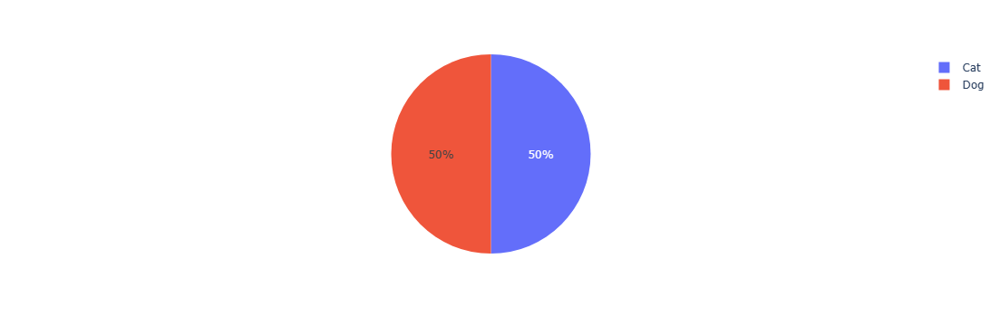

In [2]:
class_names = ['Cat', 'Dog'] 

n_dogs = len(os.listdir('C:/Users/CMO/Downloads/DataSet/PetImages/Dog'))
n_cats = len(os.listdir('C:/Users/CMO/Downloads/DataSet/PetImages/Cat'))
n_images = [n_cats, n_dogs]
px.pie(names=class_names, values=n_images)

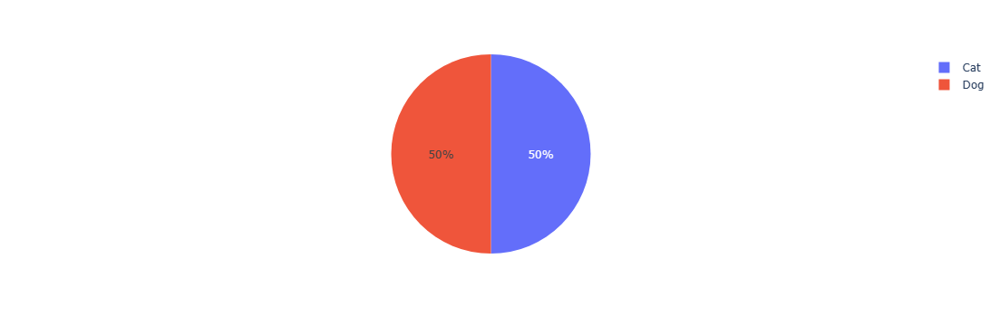

In [3]:
class_names = ['Cat', 'Dog'] 

n_dogs = len(os.listdir('C:/Users/CMO/Downloads/DataSet/PetImages/Dog'))
n_cats = len(os.listdir('C:/Users/CMO/Downloads/DataSet/PetImages/Cat'))
n_images = [n_cats, n_dogs]
px.pie(names=class_names, values=n_images)

In [4]:
try:
    os.mkdir('C:/Users/CMO/Downloads/DataSet/tmp')
    os.mkdir('C:/Users/CMO/Downloads/DataSet/training')
    os.mkdir('C:/Users/CMO/Downloads/DataSet/validation')
    os.mkdir('C:/Users/CMO/Downloads/DataSet/test')
    os.mkdir('C:/Users/CMO/Downloads/DataSet/training/cats')
    os.mkdir('C:/Users/CMO/Downloads/DataSet/training/dogs')
    os.mkdir('C:/Users/CMO/Downloads/DataSet/validation/cats')
    os.mkdir('C:/Users/CMO/Downloads/DataSet/validation/dogs')
    os.mkdir('C:/Users/CMO/Downloads/DataSet/test/cats')
    os.mkdir('C:/Users/CMO/Downloads/DataSet/test/dogs')
except OSError:
    print('Error failed to make directory')

Error failed to make directory


In [5]:
#Define data path
CAT_DIR = 'C:/Users/CMO/Downloads/DataSet/PetImages/Cat'
DOG_DIR = 'C:/Users/CMO/Downloads/DataSet/PetImages/Dog'

TRAINING_DIR = "C:/Users/CMO/Downloads/DataSet/training"
VALIDATION_DIR = "C:/Users/CMO/Downloads/DataSet/validation"

TRAINING_CATS = os.path.join(TRAINING_DIR, "cats/")
VALIDATION_CATS = os.path.join(VALIDATION_DIR, "cats/")

TRAINING_DOGS = os.path.join(TRAINING_DIR, "dogs/")
VALIDATION_DOGS = os.path.join(VALIDATION_DIR, "dogs/")

# Define whether to include test split or not
INCLUDE_TEST = True

In [6]:
def split_data(main_dir, training_dir, validation_dir, test_dir=None, include_test_split = True,  split_size=0.9):
    """
    Splits the data into train validation and test sets (optional)

    Args:
    main_dir (string):  path containing the images
    training_dir (string):  path to be used for training
    validation_dir (string):  path to be used for validation
    test_dir (string):  path to be used for test
    include_test_split (boolen):  whether to include a test split or not
    split_size (float): size of the dataset to be used for training
    """
    files = []
    for file in os.listdir(main_dir):
        if  os.path.getsize(os.path.join(main_dir, file)): # check if the file's size isn't 0
            files.append(file) # appends file name to a list

    shuffled_files = random.sample(files,  len(files)) # shuffles the data
    split = int(0.9 * len(shuffled_files)) #the training split casted into int for numeric rounding
    train = shuffled_files[:split] #training split
    split_valid_test = int(split + (len(shuffled_files)-split)/2)
   
    if include_test_split:
        validation = shuffled_files[split:split_valid_test] # validation split
        test = shuffled_files[split_valid_test:]
    else:
        validation = shuffled_files[split:]

    for element in train:
        copyfile(os.path.join(main_dir,  element), os.path.join(training_dir, element)) # copy files into training directory

    for element in validation:
        copyfile(os.path.join(main_dir,  element), os.path.join(validation_dir, element))# copy files into validation directory
        
    if include_test_split:
        for element in test:
            copyfile(os.path.join(main_dir,  element), os.path.join(test_dir, element)) # copy files into test directory
    print("Split sucessful!")

In [7]:
split_data(CAT_DIR, 'C:/Users/CMO/Downloads/DataSet/training/cats', 'C:/Users/CMO/Downloads/DataSet/validation/cats', 'C:/Users/CMO/Downloads/DataSet/test/cats',INCLUDE_TEST, 0.9)
split_data(DOG_DIR, 'C:/Users/CMO/Downloads/DataSet/training/dogs', 'C:/Users/CMO/Downloads/DataSet/validation/dogs','C:/Users/CMO/Downloads/DataSet/test/dogs',INCLUDE_TEST, 0.9)

Split sucessful!
Split sucessful!


In [8]:
print(len(os.listdir('C:/Users/CMO/Downloads/DataSet/training/cats')))
print(len(os.listdir('C:/Users/CMO/Downloads/DataSet/training/dogs')))

print(len(os.listdir('C:/Users/CMO/Downloads/DataSet/validation/cats')))
print(len(os.listdir('C:/Users/CMO/Downloads/DataSet/validation/dogs')))


print(len(os.listdir('C:/Users/CMO/Downloads/DataSet/test/cats')))
print(len(os.listdir('C:/Users/CMO/Downloads/DataSet/test/dogs')))

12487
12484
1782
1782
1792
1795


In [9]:
train_gen = ImageDataGenerator(
        rescale=1./255)


validation_gen =  ImageDataGenerator(
        rescale=1./255.)

if INCLUDE_TEST:
    test_gen =  ImageDataGenerator(
            rescale=1./255.)

In [10]:
train_generator = train_gen.flow_from_directory(
        'C:/Users/CMO/Downloads/DataSet/training',
        target_size=(150, 150),
        batch_size=64,
        class_mode='binary')
validation_generator = validation_gen.flow_from_directory(
        'C:/Users/CMO/Downloads/DataSet/validation',
        target_size=(150, 150),
        batch_size=64,
        class_mode='binary')

if INCLUDE_TEST:
    test_generator = test_gen.flow_from_directory(
        'C:/Users/CMO/Downloads/DataSet/validation',
        target_size=(150, 150),
        batch_size=64,
        class_mode='binary')

Found 24969 images belonging to 2 classes.
Found 3564 images belonging to 2 classes.
Found 3564 images belonging to 2 classes.


In [11]:
class_names = ['Cat', 'Dog']
def plot_data(generator, n_images):
    """
    Plots random data from dataset
    Args:
    generator: a generator instance
    n_images : number of images to plot
    """
    i = 1
    images, labels = generator.next()
    labels = labels.astype('int32')

    plt.figure(figsize=(14, 15))
    
    for image, label in zip(images, labels):
        plt.subplot(4, 3, i)
        plt.imshow(image)
        plt.title(class_names[label])
        plt.axis('off')
        i += 1
        if i == n_images:
            break
    
    plt.show()

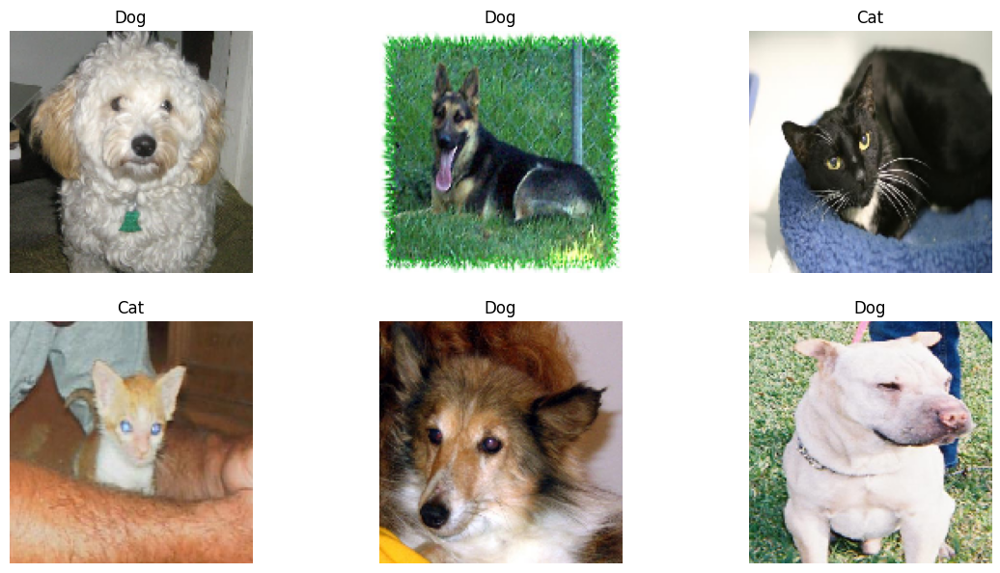

In [12]:
plot_data(train_generator,7)

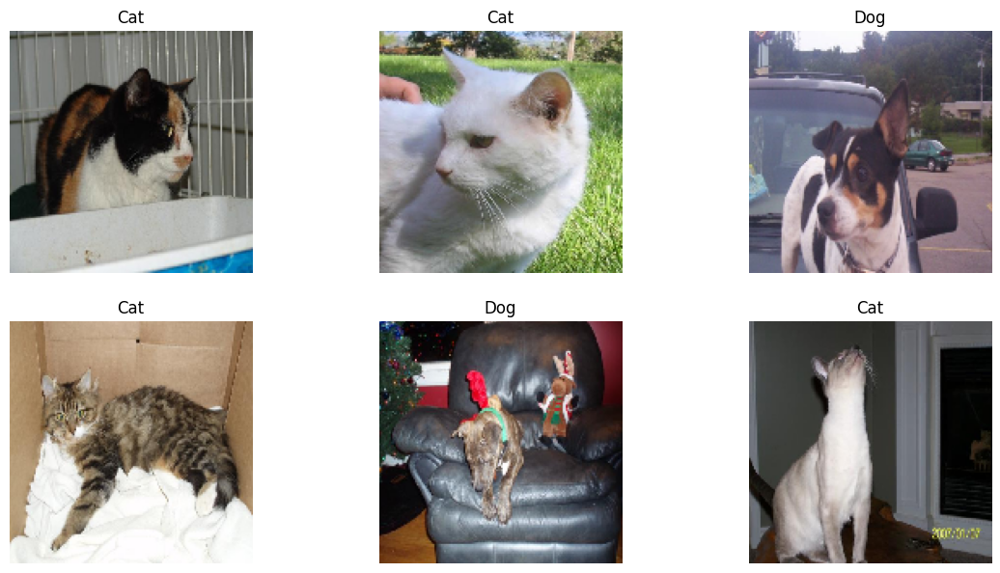

In [13]:
plot_data(validation_generator,7)

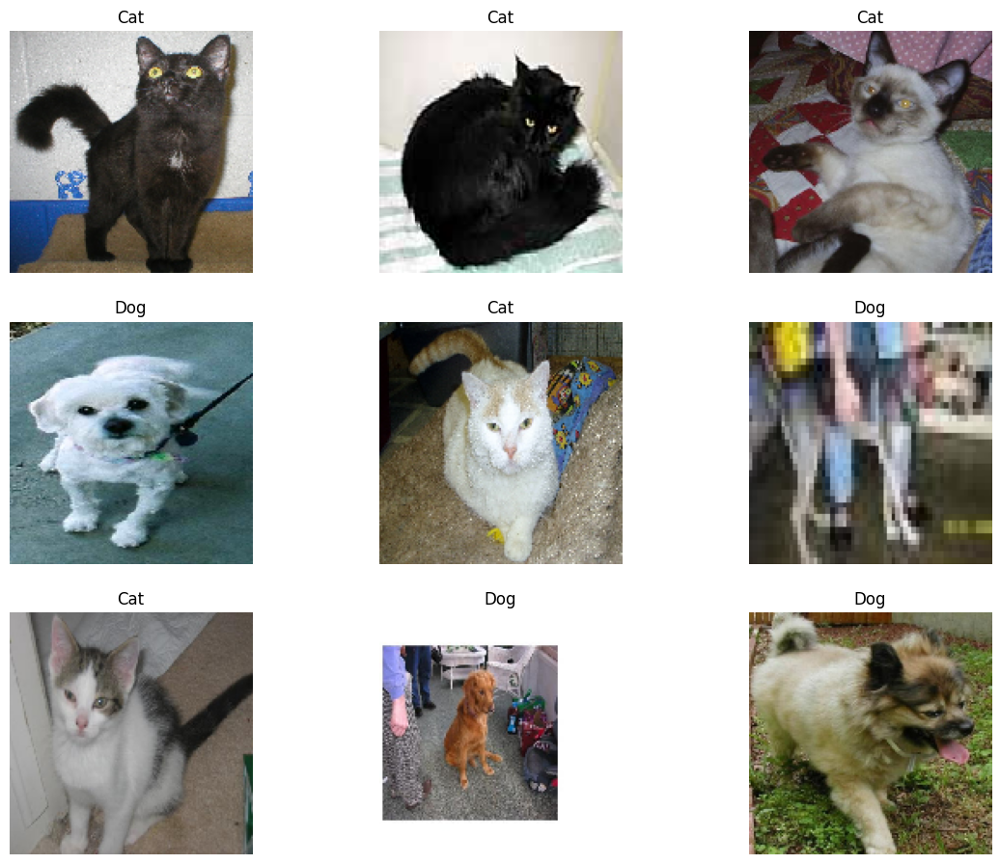

In [14]:
if INCLUDE_TEST:
    plot_data(test_generator, 10)

In [15]:
inputs = tf.keras.layers.Input(shape=(150,150,3))
x =  tf.keras.layers.Conv2D(32, (3,3), activation='relu')(inputs)
x = tf.keras.layers.Conv2D(64, (3,3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D(2,2)(x)

x = tf.keras.layers.Conv2D(64, (3,3), activation='relu')(x)
x = tf.keras.layers.Conv2D(128, (3,3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D(2,2)(x)

x = tf.keras.layers.Conv2D(128, (3,3), activation='relu')(x)
x = tf.keras.layers.Conv2D(256, (3,3), activation='relu')(x)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = Dense(1024,activation='relu')(x)
x = tf.keras.layers.Dense(2, activation='softmax')(x) 

model = Model(inputs=inputs, outputs=x)

In [16]:
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.001),
              loss='sparse_categorical_crossentropy',
              metrics = ['accuracy'])

In [17]:
r = model.fit(
        train_generator,
        epochs=10,#Training longer could yield better results
        validation_data=validation_generator)

Epoch 1/10


312/391 [======================>.......] - ETA: 5:39 - loss: 0.6906 - accuracy: 0.5256

C:\Users\CMO\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\PIL\TiffImagePlugin.py:858: UserWarning:

Truncated File Read



391/391 [==============================] - 1771s 5s/step - loss: 0.6871 - accuracy: 0.5372 - val_loss: 0.6622 - val_accuracy: 0.6004
Epoch 2/10
391/391 [==============================] - 1563s 4s/step - loss: 0.6491 - accuracy: 0.6261 - val_loss: 0.6125 - val_accuracy: 0.6608
Epoch 3/10
391/391 [==============================] - 1317s 3s/step - loss: 0.6052 - accuracy: 0.6750 - val_loss: 0.5849 - val_accuracy: 0.6947
Epoch 4/10
391/391 [==============================] - 1302s 3s/step - loss: 0.5757 - accuracy: 0.7015 - val_loss: 0.6079 - val_accuracy: 0.6684
Epoch 5/10
391/391 [==============================] - 1326s 3s/step - loss: 0.5509 - accuracy: 0.7247 - val_loss: 0.5179 - val_accuracy: 0.7528
Epoch 6/10
391/391 [==============================] - 1320s 3s/step - loss: 0.5370 - accuracy: 0.7363 - val_loss: 0.5573 - val_accuracy: 0.7172
Epoch 7/10
391/391 [==============================] - 1419s 4s/step - loss: 0.5192 - accuracy: 0.7482 - val_loss: 0.5433 - val_accuracy: 0.7222
Epo

In [18]:
if INCLUDE_TEST:
    model.evaluate(test_generator)

56/56 [==============================] - 73s 1s/step - loss: 0.4067 - accuracy: 0.8221


In [19]:
def plot_prediction(generator, n_images):
    """
    Test the model on random predictions
    Args:
    generator: a generator instance
    n_images : number of images to plot

    """
    i = 1
    # Get the images and the labels from the generator
    images, labels = generator.next()
    # Gets the model predictions
    preds = model.predict(images)
    predictions = np.argmax(preds, axis=1)
    labels = labels.astype('int32')
    plt.figure(figsize=(14, 15))
    for image, label in zip(images, labels):
        plt.subplot(4, 3, i)
        plt.imshow(image)
        if predictions[i] == labels[i]:
            title_obj = plt.title(class_names[label])
            plt.setp(title_obj, color='g') 
            plt.axis('off')
        else:
            title_obj = plt.title(class_names[label])
            plt.setp(title_obj, color='r') 
            plt.axis('off')
        i += 1
        if i == n_images:
            break
    
    plt.show()

2/2 [==============================] - 2s 676ms/step


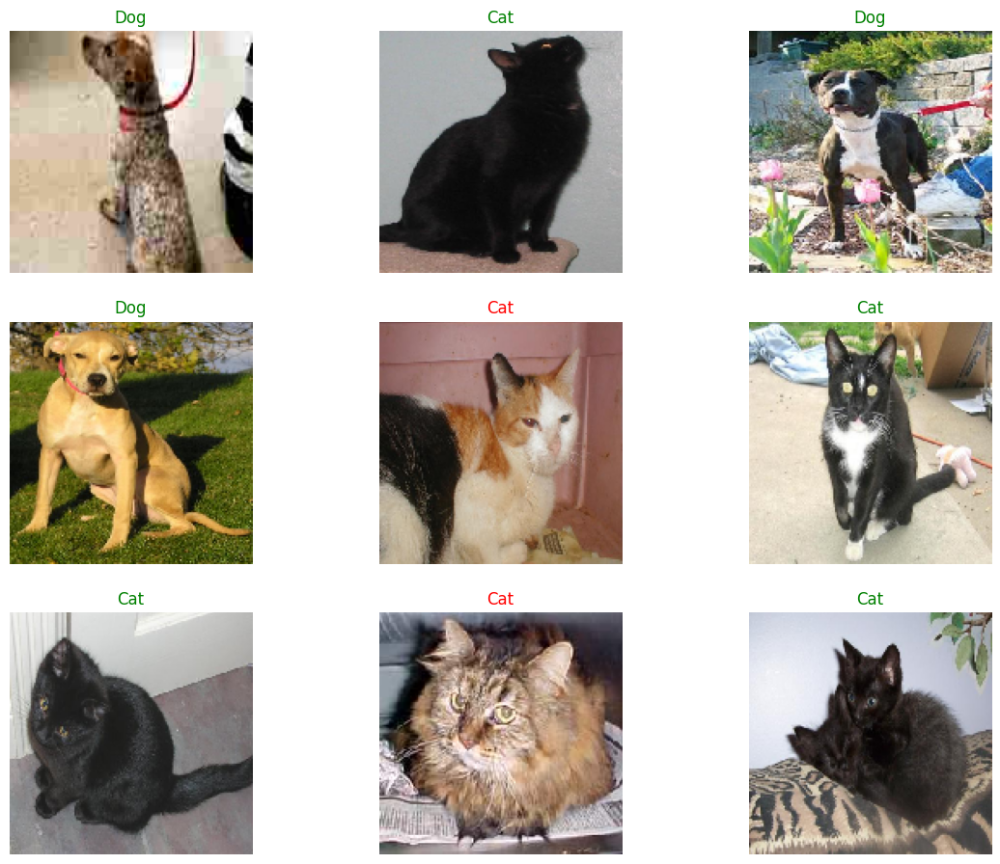

In [20]:
if INCLUDE_TEST:
    plot_prediction(test_generator, 10)

2/2 [==============================] - 1s 656ms/step


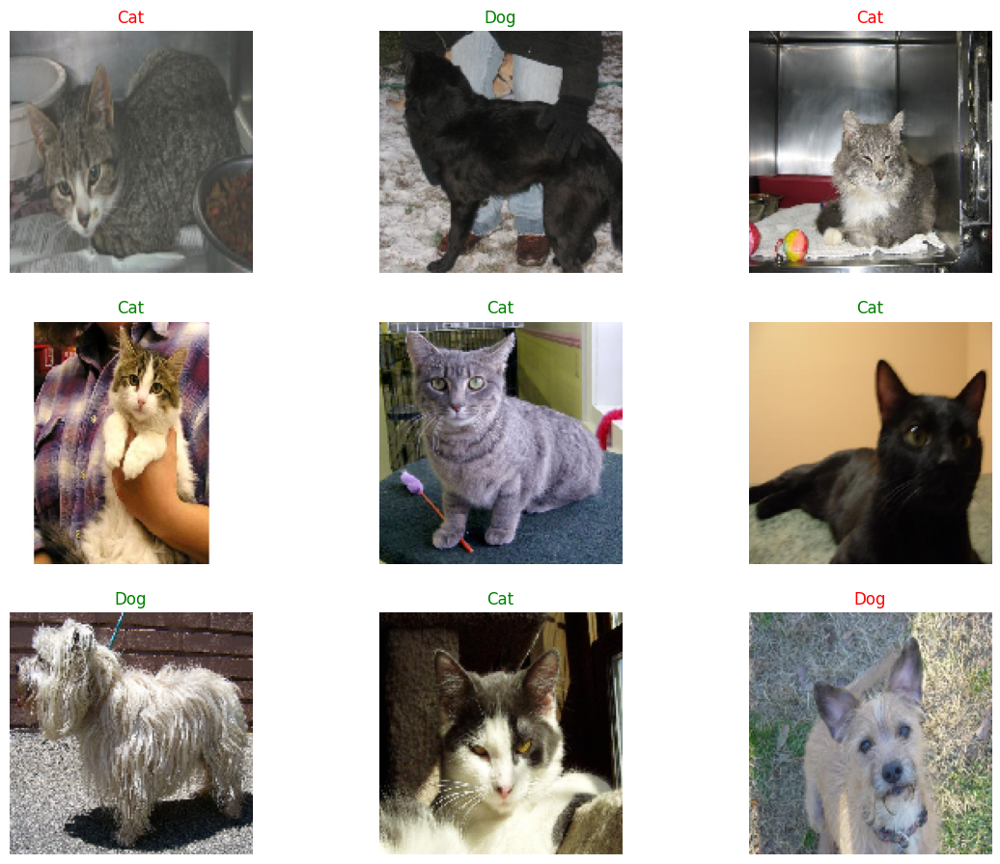

In [21]:
plot_prediction(validation_generator, 10)

In [22]:
# Create a  model to visualize activation maps
gp_weights =  model.get_layer('dense').get_weights()[0]
activation_model = Model(model.inputs, outputs=(model.get_layer('conv2d_5').output, model.get_layer('dense_1').output))

In [23]:
# Use the model to make predictions on the test generator
images, _ = test_generator.next()
features, results = activation_model.predict(images)

2/2 [==============================] - 2s 666ms/step


In [24]:
def show_cam(image_index, features, results):
    """
    Shows activation maps
    Args:
    image_index: index of image
    features: the extracted features
    results: model's predictions
    """
    # takes the features of the chosen image
    features_for_img = features[image_index,:,:,:]

    # get the class with the highest output probability
    prediction = np.argmax(results[image_index])

    # get the gap weights at the predicted class
    class_activation_weights = gp_weights[:,prediction]

    # upsample the features to the image's original size (150 x 150)
    class_activation_features = sp.ndimage.zoom(features_for_img, (150/30, 150/30, 1), order=2)

    # compute the intensity of each feature in the CAM
    cam_output  = np.dot(class_activation_features,class_activation_weights)

    print('Predicted Class = ' +str(class_names[prediction])+ ', Probability = ' + str(results[image_index][prediction]))

    # show the upsampled image
    
    plt.imshow(images[image_index])

    # strongly classified (95% probability) images will be in green, else red
    if results[image_index][prediction]>0.95:
        cmap_str = 'Greens'
    else:
        cmap_str = 'Blues'

    # overlay the cam output
    plt.imshow(cam_output, cmap=cmap_str, alpha=0.5)

    # display the image
    plt.show()

In [25]:
def show_maps(desired_class, num_maps):
    '''
    goes through the first 10,000 test images and generates Cam activation maps
    Args:
    desired_class: class to show the maps for
    num_maps: number of maps to be generated 
    '''
    counter = 0
    # go through the first 10000 images
    for i in range(0,10000):
        # break if we already displayed the specified number of maps
        if counter == num_maps:
            break

        # images that match the class will be shown
        if np.argmax(results[i]) == desired_class:
            counter += 1
            show_cam(i,features, results)

Predicted Class = Dog, Probability = 0.9578033


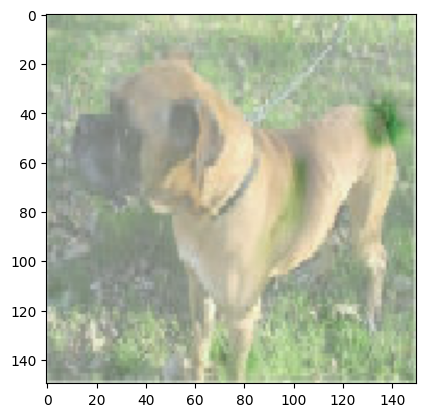

Predicted Class = Dog, Probability = 0.5520889


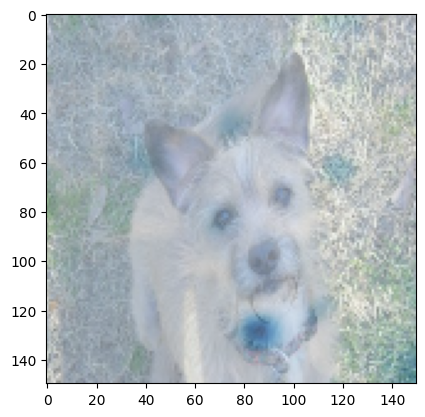

Predicted Class = Dog, Probability = 0.8428271


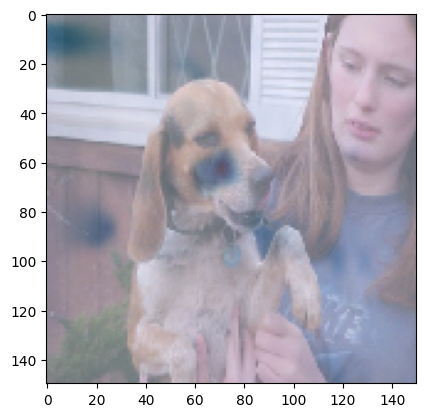

Predicted Class = Dog, Probability = 0.6192497


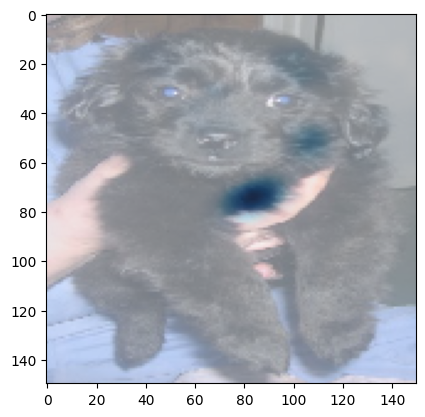

Predicted Class = Dog, Probability = 0.84665954


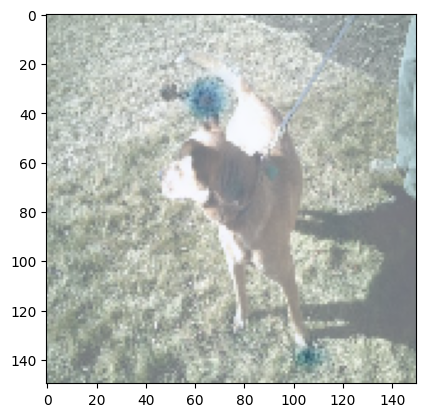

In [26]:
show_maps(desired_class=1, num_maps=5)

Predicted Class = Cat, Probability = 0.84270304


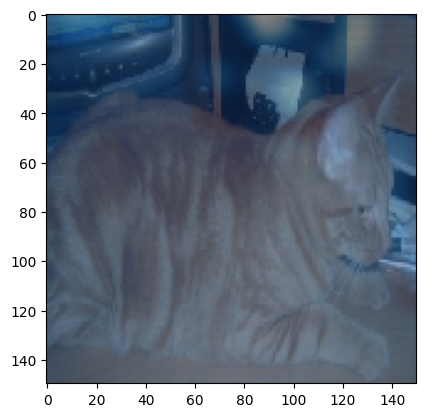

Predicted Class = Cat, Probability = 0.9710253


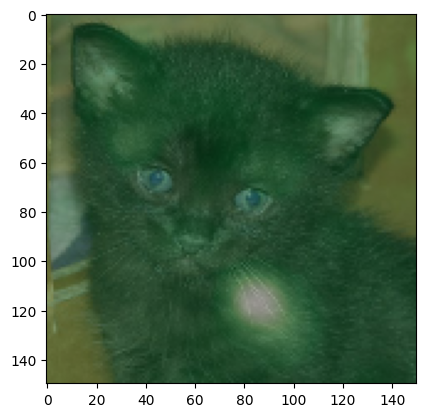

Predicted Class = Cat, Probability = 0.96784335


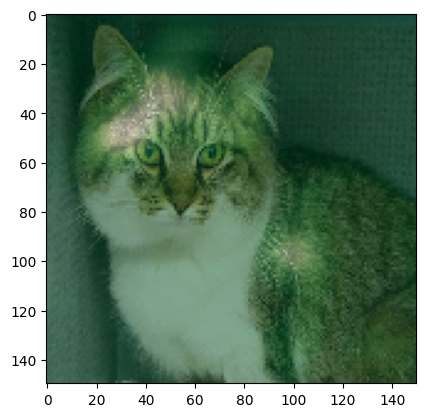

Predicted Class = Cat, Probability = 0.8628976


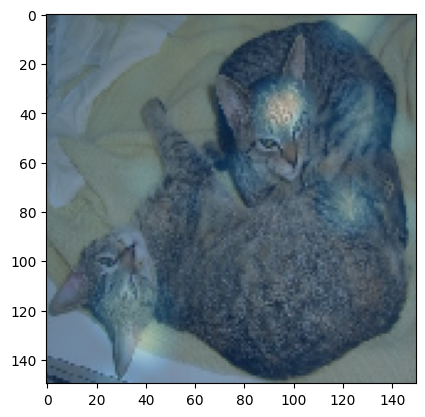

Predicted Class = Cat, Probability = 0.7877596


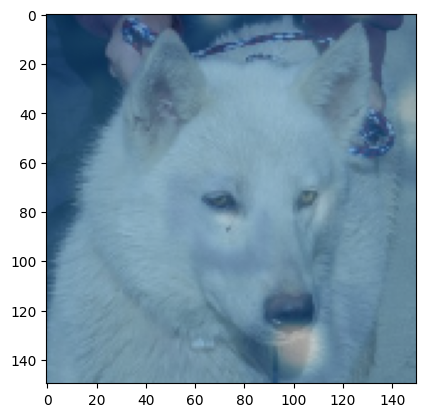

In [27]:
show_maps(desired_class=0, num_maps=5)

In [28]:
results = pd.DataFrame(r.history)
results.tail()

,loss,accuracy,val_loss,val_accuracy
5,0.537006,0.736273,0.557268,0.717172
6,0.519178,0.748248,0.543299,0.722222
7,0.501646,0.758140,0.466576,0.783951
8,0.480311,0.774040,0.522153,0.741021
9,0.461159,0.787857,0.406659,0.822110


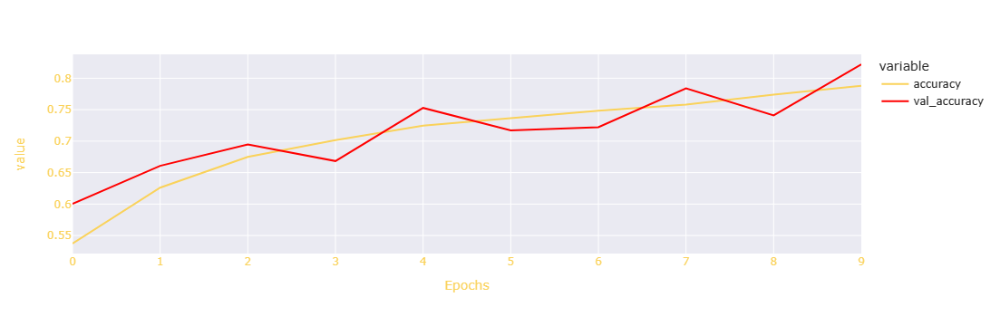

In [29]:
fig = px.line(results,y=[results['accuracy'],results['val_accuracy']],template="seaborn",color_discrete_sequence=['#fad25a','red'])
fig.update_layout(   
    title_font_color="#fad25a", 
    xaxis=dict(color="#fad25a",title='Epochs'), 
    yaxis=dict(color="#fad25a")
 )
fig.show()